In [103]:
#import all libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')
%matplotlib inline
#import label encoder
from sklearn.preprocessing import LabelEncoder
#import tqdm
from tqdm import tqdm
#import scaler
from sklearn.preprocessing import StandardScaler
#import normalization
from sklearn.preprocessing import MinMaxScaler
from scipy.stats import norm
from scipy import optimize
from svm_utils import *
from sklearn import preprocessing
from sklearn.metrics import *

In [6]:
df = pd.read_csv('diabetic_data.csv')
df.head()

,encounter_id,patient_nbr,race,gender,age,weight,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,...,citoglipton,insulin,glyburide-metformin,glipizide-metformin,glimepiride-pioglitazone,metformin-rosiglitazone,metformin-pioglitazone,change,diabetesMed,readmitted
0,2278392,8222157,Caucasian,Female,[0-10),?,6,25,1,1,...,No,No,No,No,No,No,No,No,No,NO
1,149190,55629189,Caucasian,Female,[10-20),?,1,1,7,3,...,No,Up,No,No,No,No,No,Ch,Yes,>30
2,64410,86047875,AfricanAmerican,Female,[20-30),?,1,1,7,2,...,No,No,No,No,No,No,No,No,Yes,NO
3,500364,82442376,Caucasian,Male,[30-40),?,1,1,7,2,...,No,Up,No,No,No,No,No,Ch,Yes,NO
4,16680,42519267,Caucasian,Male,[40-50),?,1,1,7,1,...,No,Steady,No,No,No,No,No,Ch,Yes,NO


In [7]:
#print the shape of data
print('Shape of data:',df.shape)

Shape of data: (101766, 50)


In [8]:
#total number of columns in df
print('Total number of columns in df:',len(df.columns))

Total number of columns in df: 50


In [9]:
#total null values in data each column  
print('Total null values in data each column:',df.isnull().sum())

Total null values in data each column: encounter_id                0
patient_nbr                 0
race                        0
gender                      0
age                         0
weight                      0
admission_type_id           0
discharge_disposition_id    0
admission_source_id         0
time_in_hospital            0
payer_code                  0
medical_specialty           0
num_lab_procedures          0
num_procedures              0
num_medications             0
number_outpatient           0
number_emergency            0
number_inpatient            0
diag_1                      0
diag_2                      0
diag_3                      0
number_diagnoses            0
max_glu_serum               0
A1Cresult                   0
metformin                   0
repaglinide                 0
nateglinide                 0
chlorpropamide              0
glimepiride                 0
acetohexamide               0
glipizide                   0
glyburide                   0
t

In [10]:
#total count of ? in data each column
print('Total count of ? in data each column:',df.eq('?').sum())

Total count of ? in data each column: encounter_id                    0
patient_nbr                     0
race                         2273
gender                          0
age                             0
weight                      98569
admission_type_id               0
discharge_disposition_id        0
admission_source_id             0
time_in_hospital                0
payer_code                  40256
medical_specialty           49949
num_lab_procedures              0
num_procedures                  0
num_medications                 0
number_outpatient               0
number_emergency                0
number_inpatient                0
diag_1                         21
diag_2                        358
diag_3                       1423
number_diagnoses                0
max_glu_serum                   0
A1Cresult                       0
metformin                       0
repaglinide                     0
nateglinide                     0
chlorpropamide                  0
glimepirid

In [11]:
#total number of unique values in data each readmitted column
print('Total number of unique values in data each readmitted column:',df['readmitted'].nunique())
#show the unique values in readmitted column
print('Unique values in readmitted column:',df['readmitted'].unique())

Total number of unique values in data each readmitted column: 3
Unique values in readmitted column: ['NO' '>30' '<30']


In [12]:
#total readmitted values
print('Total readmitted values:',df['readmitted'].value_counts())

Total readmitted values: NO     54864
>30    35545
<30    11357
Name: readmitted, dtype: int64


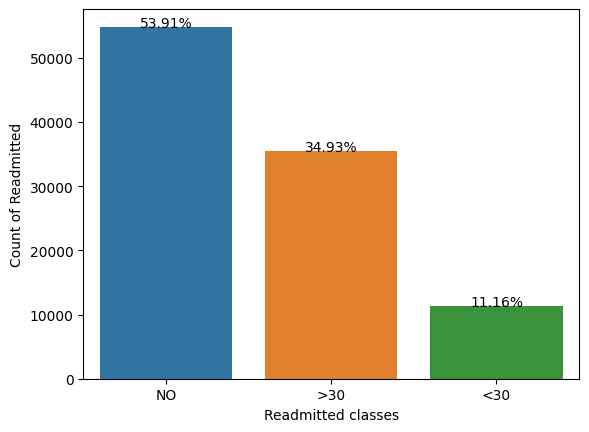

In [13]:
#plot a bar graph for readmitted values using seaborn in percentage
ax = sns.countplot(x='readmitted',data=df)
#x-axis label
plt.xlabel('Readmitted classes')
#y-axis label
plt.ylabel('Count of Readmitted')
#calculate percentage
total = len(df['readmitted'])
for p in ax.patches:
    height = p.get_height()
    ax.text(p.get_x()+p.get_width()/2.,
            height + 3,
            '{:1.2f}%'.format(height/total*100),
            ha="center")
plt.show()


In [14]:
#create a new column called readmitted_class
df['readmitted_class'] = df['readmitted'].apply(lambda x: 0 if x == 'NO' else 1)

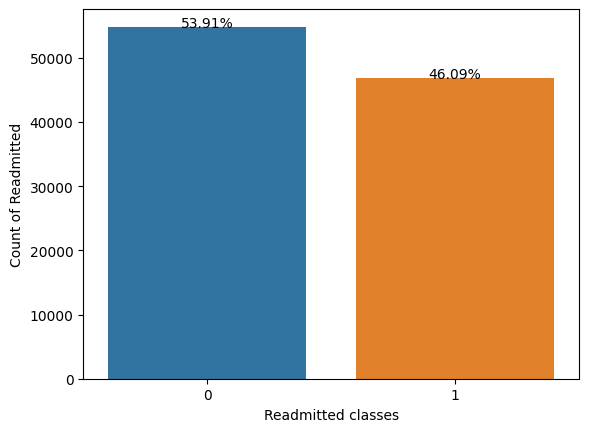

In [15]:
#plot a bar graph for readmitted values using seaborn in percentage
ax = sns.countplot(x='readmitted_class',data=df)
#x-axis label
plt.xlabel('Readmitted classes')
#y-axis label
plt.ylabel('Count of Readmitted')
#calculate percentage
total = len(df['readmitted_class'])
for p in ax.patches:
    height = p.get_height()
    ax.text(p.get_x()+p.get_width()/2.,
            height + 3,
            '{:1.2f}%'.format(height/total*100),
            ha="center")
plt.show()

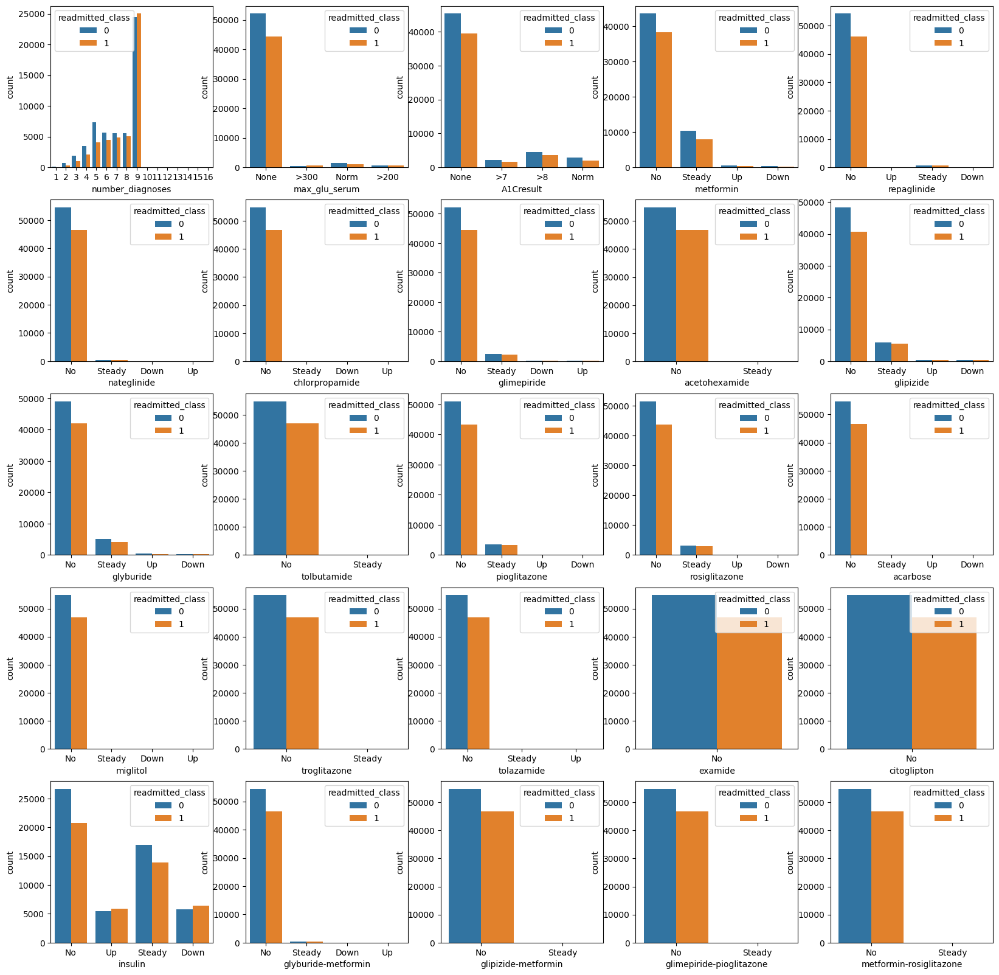

In [16]:
#plot subplots of countplot using seaborn for columns in 21 to 44 index vs readmitted_class
fig, axes = plt.subplots(5, 5, figsize=(20, 20))
for i, col in enumerate(df.columns[21:46]):
    sns.countplot(x=col, hue='readmitted_class', data=df, ax=axes[i//5, i%5])
plt.show()

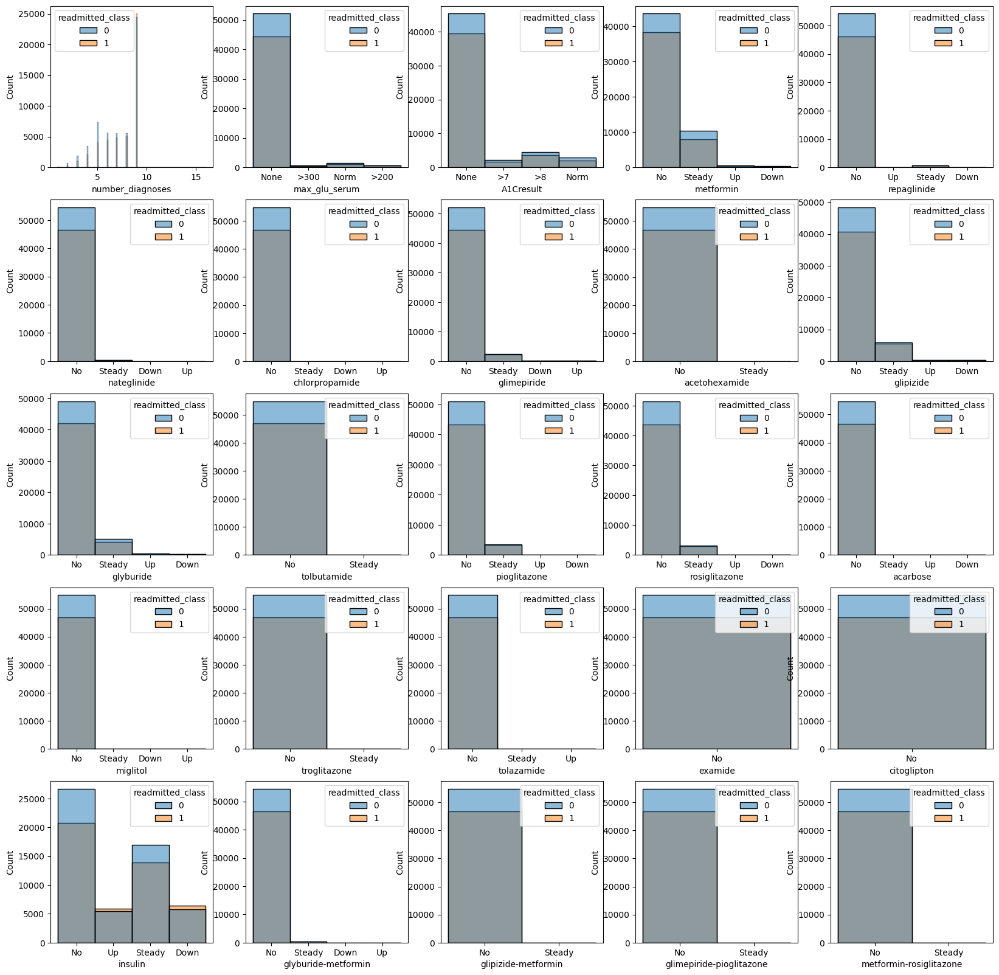

In [17]:
#plot subplots of histplot of readmitted class with respect to each value in columns in 21 to 44 index 
fig, axes = plt.subplots(5, 5, figsize=(20, 20))
for i, col in enumerate(df.columns[21:46]):
    sns.histplot(x=col, hue='readmitted_class', data=df, ax=axes[i//5, i%5])
plt.show()


In [18]:
df.drop(columns = ['acetohexamide', 'tolbutamide', 'troglitazone', 'tolazamide', 'examide', 'citoglipton',
                   'glipizide-metformin', 'glimepiride-pioglitazone', 'metformin-rosiglitazone',
                   'metformin-pioglitazone'], inplace = True)

In [19]:
#value counts of payer_code column
print('Value counts of payer_code:',df['payer_code'].value_counts())


Value counts of payer_code: ?     40256
MC    32439
HM     6274
SP     5007
BC     4655
MD     3532
CP     2533
UN     2448
CM     1937
OG     1033
PO      592
DM      549
CH      146
WC      135
OT       95
MP       79
SI       55
FR        1
Name: payer_code, dtype: int64


In [20]:
#percentage of each value in payer_code column
print('Percentage of each value in payer_code:',df['payer_code'].value_counts(normalize=True))


Percentage of each value in payer_code: ?     0.395574
MC    0.318761
HM    0.061651
SP    0.049201
BC    0.045742
MD    0.034707
CP    0.024890
UN    0.024055
CM    0.019034
OG    0.010151
PO    0.005817
DM    0.005395
CH    0.001435
WC    0.001327
OT    0.000934
MP    0.000776
SI    0.000540
FR    0.000010
Name: payer_code, dtype: float64


In [21]:
#drop payer code column
df.drop(columns = ['payer_code'], inplace = True)

In [22]:
#values of ? in each column
print('Values of ? in each column:',df.eq('?').sum())

Values of ? in each column: encounter_id                    0
patient_nbr                     0
race                         2273
gender                          0
age                             0
weight                      98569
admission_type_id               0
discharge_disposition_id        0
admission_source_id             0
time_in_hospital                0
medical_specialty           49949
num_lab_procedures              0
num_procedures                  0
num_medications                 0
number_outpatient               0
number_emergency                0
number_inpatient                0
diag_1                         21
diag_2                        358
diag_3                       1423
number_diagnoses                0
max_glu_serum                   0
A1Cresult                       0
metformin                       0
repaglinide                     0
nateglinide                     0
chlorpropamide                  0
glimepiride                     0
glipizide           

In [23]:
#drop the medical specialty column
df.drop(columns = ['medical_specialty'], inplace = True)

In [24]:
#drop diag_1, diag_2, diag_3 columns with ? values
df.drop(df[df['diag_1'] == '?'].index, inplace = True)
df.drop(df[df['diag_2'] == '?'].index, inplace = True)
df.drop(df[df['diag_3'] == '?'].index, inplace = True)


In [25]:
df.shape

(100244, 39)

In [26]:
#rename diag_1, diag_2, diag_3 columns as primary_diagnosis, secondary_diagnosis, additional_diagnosis
df.rename(columns = {'diag_1':'primary_diagnosis', 'diag_2':'secondary_diagnosis', 'diag_3':'additional_diagnosis'}, inplace = True)


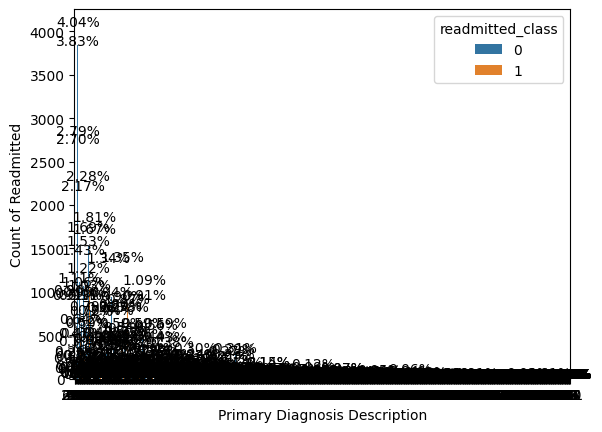

In [27]:
#plot bar graph of primary_diagnosis column using seaborn vs readmitted_class column
ax = sns.countplot(x='primary_diagnosis', hue='readmitted_class', data=df)
#x-axis label
plt.xlabel('Primary Diagnosis Description')
#y-axis label
plt.ylabel('Count of Readmitted')
#calculate percentage
total = len(df['readmitted_class'])
for p in ax.patches:
    height = p.get_height()
    ax.text(p.get_x()+p.get_width()/2.,
            height + 3,
            '{:1.2f}%'.format(height/total*100),
            ha="center")
plt.show()


In [28]:
#unique values in primary_diagnosis column
df['primary_diagnosis'].unique()

array(['276', '648', '8', '197', '414', '428', '398', '434', '250.7',
       '157', '518', '999', '410', '682', '402', '737', '572', 'V57',
       '189', '786', '427', '996', '277', '584', '462', '473', '411',
       '174', '486', '998', '511', '432', '626', '295', '196', '250.6',
       '618', '182', '845', '423', '808', '250.4', '722', '403', '784',
       '707', '440', '151', '715', '997', '198', '564', '812', '38',
       '590', '556', '578', '250.32', '433', 'V58', '569', '185', '536',
       '255', '250.13', '599', '558', '574', '491', '560', '244',
       '250.03', '577', '730', '188', '824', '250.8', '332', '562', '291',
       '296', '510', '401', '263', '438', '70', '642', '625', '571',
       '738', '593', '250.42', '807', '456', '446', '575', '250.41',
       '250.02', '820', '515', '780', '250.22', '995', '235', '250.82',
       '721', '787', '162', '724', '282', '250.83', '514', 'V55', '281',
       '250.33', '530', '466', '435', '250.12', 'V53', '789', '566',
       '822

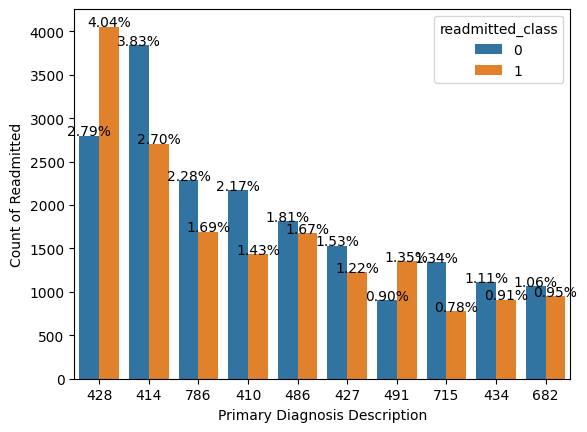

In [29]:
ax = sns.countplot(x='primary_diagnosis', hue='readmitted_class', data=df, order=df['primary_diagnosis'].value_counts().iloc[:10].index)
#x-axis label
plt.xlabel('Primary Diagnosis Description')
#y-axis label
plt.ylabel('Count of Readmitted')
#calculate percentage
total = len(df['readmitted_class'])
for p in ax.patches:
    height = p.get_height()
    ax.text(p.get_x()+p.get_width()/2.,
            height + 3,
            '{:1.2f}%'.format(height/total*100),
            ha="center")
plt.show()

most patients admitted are of 428 and 414 according to manual they are 428 = Congestive heart failure
414 = Ischemic heart disease

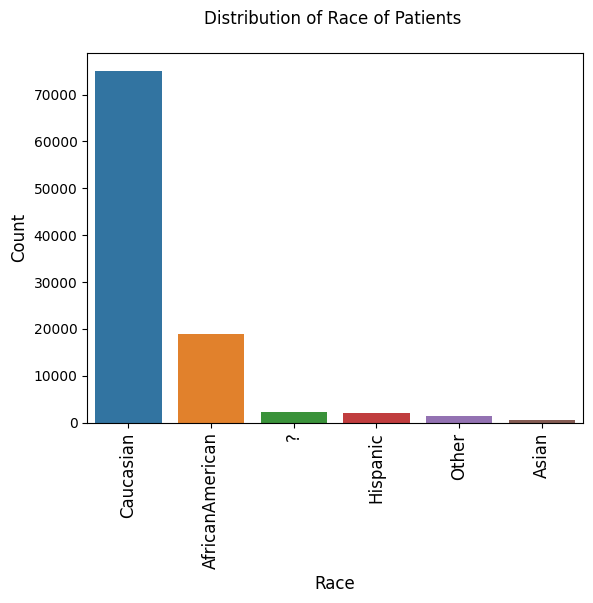

In [30]:
#plot a bar graph for race using seaborn 
ax = sns.barplot(x=df['race'].value_counts().index,   y=df['race'].value_counts())
plt.xlabel('Race', size = 12)
plt.xticks(rotation=90, size = 12)
plt.ylabel('Count', size = 12)
plt.title('Distribution of Race of Patients \n', size = 12)
plt.show()

In [31]:
df.loc[df['race'] == '?', 'race'] = 'Other'

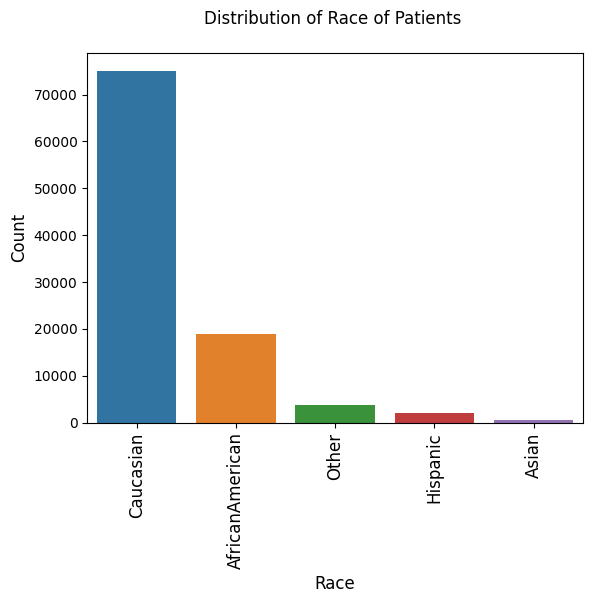

In [32]:
#plot a bar graph for race using seaborn 
ax = sns.barplot(x=df['race'].value_counts().index,   y=df['race'].value_counts())
plt.xlabel('Race', size = 12)
plt.xticks(rotation=90, size = 12)
plt.ylabel('Count', size = 12)
plt.title('Distribution of Race of Patients \n', size = 12)
plt.show()

In [33]:
df.to_csv('diabetic_data_1.csv',index=False)

In [34]:
df['gender'].value_counts()

Female             53922
Male               46319
Unknown/Invalid        3
Name: gender, dtype: int64

In [35]:
df.drop(df[df['gender'] == 'Unknown/Invalid'].index, inplace = True)
df.reset_index(inplace = True, drop = True)

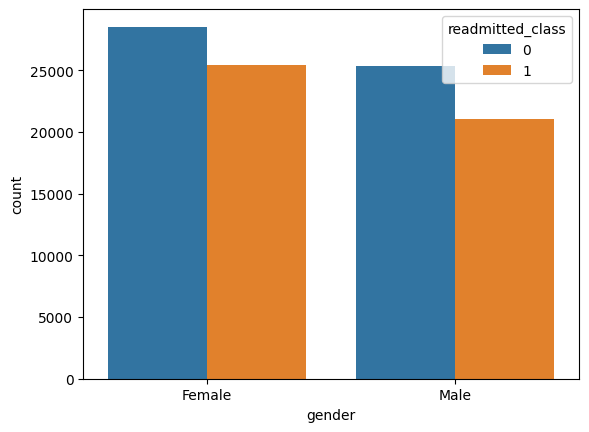

In [36]:
ax = sns.countplot(x="gender", hue="readmitted_class", data=df)

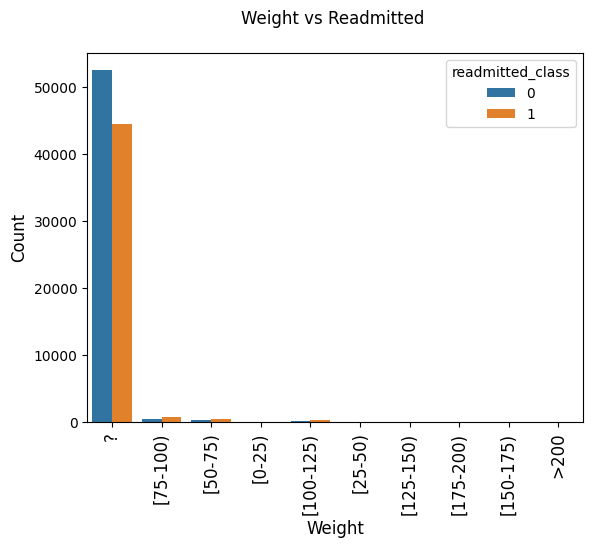

In [37]:
ax = sns.countplot(x="weight", hue="readmitted_class", data=df)
plt.xlabel('Weight', size = 12)
plt.xticks(rotation=90, size = 12)
plt.ylabel('Count', size = 12)
plt.title('Weight vs Readmitted \n', size = 12)
plt.show()

In [38]:
#drop the weight column
df.drop('weight',axis=1,inplace=True)

In [39]:
#map the admission_type_id column with admission_type_description column and put it in a new column called admission_type
df['admission_type'] = df['admission_type_id'].map({1:'Emergency',2:'Urgent',3:'Elective',4:'Newborn',5:'Not Available',6:'NULL',7:'Trauma Center',8:'Not Mapped'})

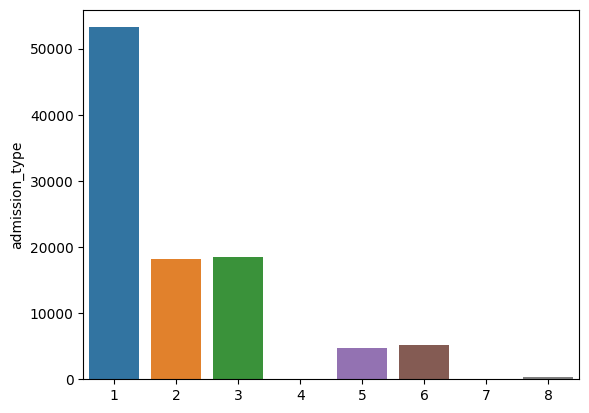

In [40]:
#plot a bar graph for admission_id using seaborn
ax = sns.barplot(x=df['admission_type_id'].value_counts().index,   y=df['admission_type'].value_counts())


In [41]:
#mean of time in hospital
print('Mean of time in hospital:',df['time_in_hospital'].mean())

Mean of time in hospital: 4.4203070599854355


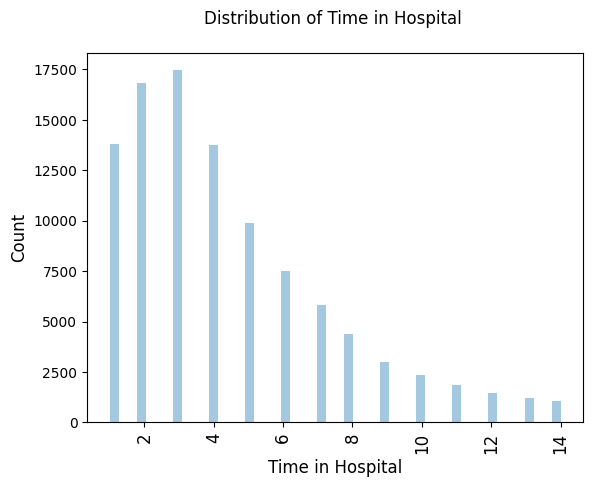

In [42]:
#plot time in hospital using seaborn
ax = sns.distplot(df['time_in_hospital'],kde=False)
plt.xlabel('Time in Hospital', size = 12)
plt.xticks(rotation=90, size = 12)
plt.ylabel('Count', size = 12)
plt.title('Distribution of Time in Hospital \n', size = 12)
plt.show()

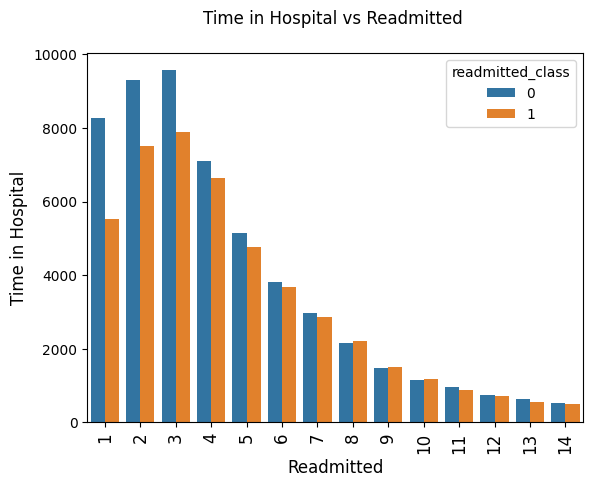

In [43]:
#plot relationship between time in hospital and readmitted using seaborn
ax = sns.countplot(x='time_in_hospital',hue = 'readmitted_class',data=df)
plt.xlabel('Readmitted', size = 12)
plt.xticks(rotation=90, size = 12)
plt.ylabel('Time in Hospital', size = 12)
plt.title('Time in Hospital vs Readmitted \n', size = 12)
plt.show()


In [44]:
categorical_features =['race', 'gender', 'age',
       'admission_type_id', 'discharge_disposition_id', 'admission_source_id', 'primary_diagnosis', 'secondary_diagnosis', 'number_diagnoses',
       'max_glu_serum', 'A1Cresult', 'metformin', 'repaglinide', 'nateglinide',
       'chlorpropamide', 'glimepiride', 'glipizide', 'glyburide',
       'pioglitazone', 'rosiglitazone', 'acarbose', 'miglitol', 'insulin',
       'glyburide-metformin', 'change', 'diabetesMed'] 

In [45]:
df2 = df.copy()

In [46]:
#convert categorical features using label encoder
for feature in categorical_features:
    le = LabelEncoder()
    df2[feature] = le.fit_transform(df2[feature])

In [47]:
#drop medical specialty column
#df2.drop('medical_specialty',axis=1,inplace=True)

In [48]:
df2.head()

,encounter_id,patient_nbr,race,gender,age,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,num_lab_procedures,...,rosiglitazone,acarbose,miglitol,insulin,glyburide-metformin,change,diabetesMed,readmitted,readmitted_class,admission_type
0,149190,55629189,2,0,1,0,0,6,3,59,...,1,1,1,3,1,0,1,>30,1,Emergency
1,64410,86047875,0,0,2,0,0,6,2,11,...,1,1,1,1,1,1,1,NO,0,Emergency
2,500364,82442376,2,1,3,0,0,6,2,44,...,1,1,1,3,1,0,1,NO,0,Emergency
3,16680,42519267,2,1,4,0,0,6,1,51,...,1,1,1,2,1,0,1,NO,0,Emergency
4,35754,82637451,2,1,5,1,0,1,3,31,...,1,1,1,2,1,1,1,>30,1,Urgent


In [49]:
#drop admission_type column
df2.drop('admission_type',axis=1,inplace=True)

In [50]:
#drop readmitted column
df2.drop('readmitted',axis=1,inplace=True)


In [51]:
#drop encounter_id column and patient_nbr column
df2.drop('encounter_id',axis=1,inplace=True)
df2.drop('patient_nbr',axis=1,inplace=True)

In [52]:
df2.head()

,race,gender,age,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,num_lab_procedures,num_procedures,num_medications,...,glyburide,pioglitazone,rosiglitazone,acarbose,miglitol,insulin,glyburide-metformin,change,diabetesMed,readmitted_class
0,2,0,1,0,0,6,3,59,0,18,...,1,1,1,1,1,3,1,0,1,1
1,0,0,2,0,0,6,2,11,5,13,...,1,1,1,1,1,1,1,1,1,0
2,2,1,3,0,0,6,2,44,1,16,...,1,1,1,1,1,3,1,0,1,0
3,2,1,4,0,0,6,1,51,0,8,...,1,1,1,1,1,2,1,0,1,0
4,2,1,5,1,0,1,3,31,6,16,...,1,1,1,1,1,2,1,1,1,1


In [53]:
#correlation between numerical features
df2[['time_in_hospital', 'num_lab_procedures', 'num_procedures', 'num_medications', 
   'number_outpatient', 'number_emergency', 'number_inpatient', 'number_diagnoses']].corr()


,time_in_hospital,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,number_diagnoses
time_in_hospital,1.000000,0.319328,0.189262,0.463840,-0.010366,-0.010421,0.072412,0.210353
num_lab_procedures,0.319328,1.000000,0.058283,0.268948,-0.007713,-0.002240,0.038665,0.151184
num_procedures,0.189262,0.058283,1.000000,0.383102,-0.026398,-0.038563,-0.067989,0.060142
num_medications,0.463840,0.268948,0.383102,1.000000,0.043229,0.012260,0.061969,0.244153
number_outpatient,-0.010366,-0.007713,-0.026398,0.043229,1.000000,0.091531,0.107052,0.092965
number_emergency,-0.010421,-0.002240,-0.038563,0.012260,0.091531,1.000000,0.267318,0.055976
number_inpatient,0.072412,0.038665,-0.067989,0.061969,0.107052,0.267318,1.000000,0.102597
number_diagnoses,0.210353,0.151184,0.060142,0.244153,0.092965,0.055976,0.102597,1.000000


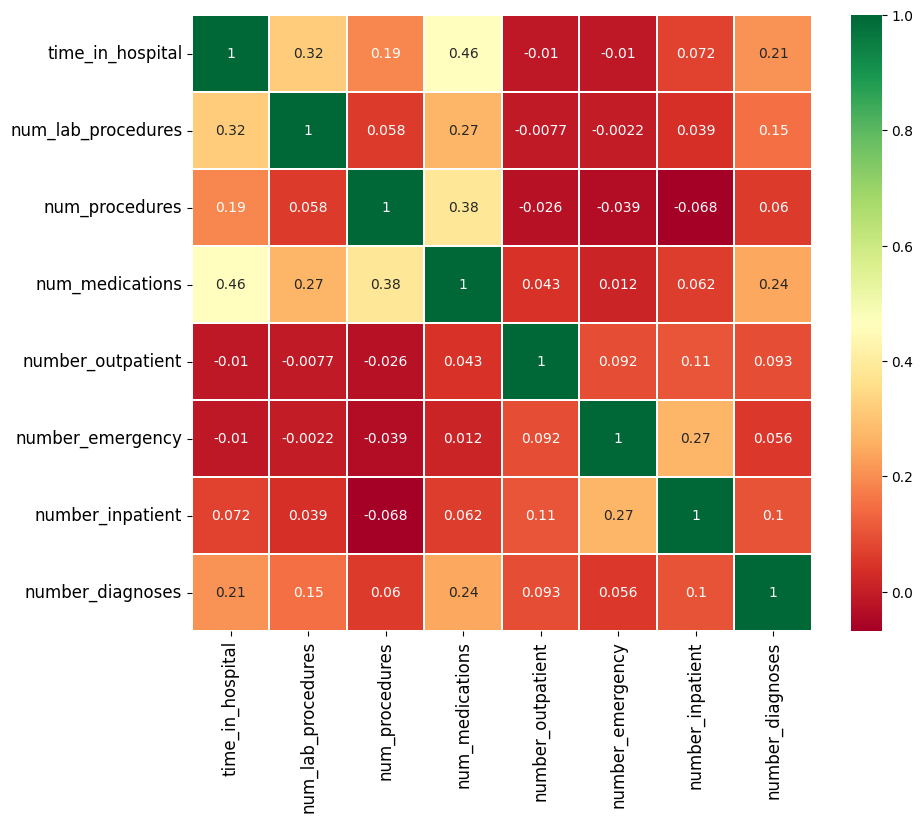

In [54]:
#generate a heat map to show correlation between numerical features
plt.figure(figsize=(10,10))
sns.heatmap(df2[['time_in_hospital', 'num_lab_procedures', 'num_procedures', 'num_medications',
         'number_outpatient', 'number_emergency', 'number_inpatient', 'number_diagnoses']].corr(),annot=True,cmap='RdYlGn',linewidths=0.2)
fig=plt.gcf()
fig.set_size_inches(10,8)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.show()

In [55]:
df2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100241 entries, 0 to 100240
Data columns (total 35 columns):
 #   Column                    Non-Null Count   Dtype 
---  ------                    --------------   ----- 
 0   race                      100241 non-null  int64 
 1   gender                    100241 non-null  int64 
 2   age                       100241 non-null  int64 
 3   admission_type_id         100241 non-null  int64 
 4   discharge_disposition_id  100241 non-null  int64 
 5   admission_source_id       100241 non-null  int64 
 6   time_in_hospital          100241 non-null  int64 
 7   num_lab_procedures        100241 non-null  int64 
 8   num_procedures            100241 non-null  int64 
 9   num_medications           100241 non-null  int64 
 10  number_outpatient         100241 non-null  int64 
 11  number_emergency          100241 non-null  int64 
 12  number_inpatient          100241 non-null  int64 
 13  primary_diagnosis         100241 non-null  int64 
 14  seco

In [56]:
#drop additional diagnosis column
df2.drop('additional_diagnosis',axis=1,inplace=True)

In [57]:
df2.drop('readmitted',axis=1,inplace=True)

KeyError: "['readmitted'] not found in axis"

In [ ]:
df2.drop('admission_type',axis=1,inplace=True)

In [ ]:
df2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100241 entries, 0 to 100240
Data columns (total 33 columns):
 #   Column                    Non-Null Count   Dtype
---  ------                    --------------   -----
 0   encounter_id              100241 non-null  int64
 1   patient_nbr               100241 non-null  int64
 2   race                      100241 non-null  int64
 3   gender                    100241 non-null  int64
 4   age                       100241 non-null  int64
 5   admission_type_id         100241 non-null  int64
 6   discharge_disposition_id  100241 non-null  int64
 7   admission_source_id       100241 non-null  int64
 8   time_in_hospital          100241 non-null  int64
 9   primary_diagnosis         100241 non-null  int64
 10  secondary_diagnosis       100241 non-null  int64
 11  max_glu_serum             100241 non-null  int64
 12  A1Cresult                 100241 non-null  int64
 13  metformin                 100241 non-null  int64
 14  repaglinide         

In [58]:
#convert dtype of df2 to float64
df2 = df2.astype('float64')

In [59]:
# #scale all the numerical features
# scaler = StandardScaler()
# df2[['time_in_hospital', 'num_lab_procedures', 'num_procedures', 'num_medications',
#          'number_outpatient', 'number_emergency', 'number_inpatient',
#             'number_diagnoses']] = scaler.fit_transform(df2[['time_in_hospital', 'num_lab_procedures', 'num_procedures', 'num_medications',
#             'number_outpatient', 'number_emergency', 'number_inpatient',
#             'number_diagnoses']])

In [60]:
#normalize the numerical features
df2[['time_in_hospital', 'num_lab_procedures', 'num_procedures', 'num_medications',
            'number_outpatient', 'number_emergency', 'number_inpatient',
            'number_diagnoses']] = preprocessing.normalize(df2[['time_in_hospital', 'num_lab_procedures', 'num_procedures', 'num_medications',
            'number_outpatient', 'number_emergency', 'number_inpatient',
            'number_diagnoses']])
df2.head()


,race,gender,age,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,num_lab_procedures,num_procedures,num_medications,...,glyburide,pioglitazone,rosiglitazone,acarbose,miglitol,insulin,glyburide-metformin,change,diabetesMed,readmitted_class
0,2.0,0.0,1.0,0.0,0.0,6.0,0.048349,0.950871,0.000000,0.290096,...,1.0,1.0,1.0,1.0,1.0,3.0,1.0,0.0,1.0,1.0
1,0.0,0.0,2.0,0.0,0.0,6.0,0.109599,0.602796,0.273998,0.712396,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0
2,2.0,1.0,3.0,0.0,0.0,6.0,0.042515,0.935324,0.021257,0.340118,...,1.0,1.0,1.0,1.0,1.0,3.0,1.0,0.0,1.0,0.0
3,2.0,1.0,4.0,0.0,0.0,6.0,0.019353,0.986994,0.000000,0.154823,...,1.0,1.0,1.0,1.0,1.0,2.0,1.0,0.0,1.0,0.0
4,2.0,1.0,5.0,1.0,0.0,1.0,0.083269,0.860447,0.166538,0.444102,...,1.0,1.0,1.0,1.0,1.0,2.0,1.0,1.0,1.0,1.0


In [61]:
#find the duplicate row in df2
duplicateRowsDF = df2[df2.duplicated()]
print(duplicateRowsDF)

Empty DataFrame
Columns: [race, gender, age, admission_type_id, discharge_disposition_id, admission_source_id, time_in_hospital, num_lab_procedures, num_procedures, num_medications, number_outpatient, number_emergency, number_inpatient, primary_diagnosis, secondary_diagnosis, number_diagnoses, max_glu_serum, A1Cresult, metformin, repaglinide, nateglinide, chlorpropamide, glimepiride, glipizide, glyburide, pioglitazone, rosiglitazone, acarbose, miglitol, insulin, glyburide-metformin, change, diabetesMed, readmitted_class]
Index: []

[0 rows x 34 columns]


In [62]:
#perform feature engineering on df2
df2['total_visits'] = df2['number_outpatient'] + df2['number_emergency'] + df2['number_inpatient']
df2['total_medications'] = df2['num_medications'] + df2['number_diagnoses']
df2['total_procedures'] = df2['num_procedures'] + df2['num_lab_procedures']
df2['total_diagnoses'] = df2['number_diagnoses'] + df2['number_inpatient']

In [63]:
#drop the columns that are no longer needed
df2.drop('number_outpatient',axis=1,inplace=True)
df2.drop('number_emergency',axis=1,inplace=True)
df2.drop('number_inpatient',axis=1,inplace=True)
df2.drop('num_medications',axis=1,inplace=True)
df2.drop('num_procedures',axis=1,inplace=True)
df2.drop('num_lab_procedures',axis=1,inplace=True)
df2.drop('number_diagnoses',axis=1,inplace=True)

In [64]:
df2.drop('encounter_id',axis=1,inplace=True)
df2.drop('patient_nbr',axis=1,inplace=True)


KeyError: "['encounter_id'] not found in axis"

In [66]:
#import split function from sklearn
from sklearn.model_selection import train_test_split

In [67]:
#split the data into train and test
X = df2.drop('readmitted_class',axis=1)
y = df2['readmitted_class']


In [68]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=101)

In [152]:
class LogisticRegression :
    def __init__(self, maxIteration, tolerance, learningRate, index=[]):
        self.learningRate = learningRate
        self.maxIteration = maxIteration
        self.tolerance = tolerance
        self.index = index
        
    def readDataset(self):
        X_train, X_test, y_train, y_test = train_test_split(df2.drop('readmitted_class',axis=1),df2['readmitted_class'] , test_size=0.3, random_state=101)
        return X_train, X_test, y_train, y_test
    
    def sigmoid(self, z):
        return 1 / (1 + np.exp(-z))
    
    def costFunction (self, X, y):
        
        #approach1
        sig = self.sigmoid(X.dot(self.w))
        cost = -(y * np.log(sig) + (1-y)*np.log(1-sig)).sum()
        cost = cost/X.shape[0]
        
        #approach2
        cost = (np.log(np.ones(X.shape[0]) + np.exp(X.dot(self.w))) - X.dot(self.w).dot(y)).sum()
        return cost
        
    def gradient(self, X, y):
        sig = self.sigmoid(X.dot(self.w))
        grad = (sig - y).dot(X)
        return grad
    
    def gradientDescent(self,X ,y):
        errors = []
        last_error = float('inf')
        
        for i in tqdm(range(self.maxIteration)):
            self.w = self.w - self.learningRate * self.gradient(X, y)
            current_error = self.costFunction(X, y)
            
            errors.append(current_error)
            diff = last_error - current_error
            last_error = current_error
            
            if np.abs(diff) < self.tolerance:
                print('model stopped learning')
                break 
                
        return
        
    def fit(self):
        self.X_train, self.X_test, self.y_train, self.y_test = self.readDataset()
        
        #removing specified indexes
        
        if len(self.index) != 0 and self.X_train.shape[0] >= max(self.index, default = 0):
            print('removing specified indexes')
            self.remove_index()
        else:
            print('no records found for specified indexes')
            
            
        print('solving using gradient descent')
        
        self.w = np.zeros(self.X_train.shape[1], dtype = np.float64)
        self.gradientDescent(self.X_train, self.y_train)
        
        print(self.w)
        
        y_hat_test = self.predict(self.X_test)
        accuracy, precision, recall = self.evaluate(self.y_test, y_hat_test)
        
        print('accuracy is ', accuracy)
        print('precision is ', precision)
        print('recall is ', recall)
       
    
    def remove_index(self):
        for index in self.index:
            self.X_train = np.delete(self.X_train, index, axis = 0)
            self.y_train = np.delete(self.y_train, index, axis = 0)
    
    def predict(self, X):
        sig = self.sigmoid(X.dot(self.w))
        return np.around(sig)
    

        
    def evaluate(self, y, y_hat):
        y = (y == 1)
        y_hat = (y_hat == 1)
        
        recall = (y & y_hat).sum() / y.sum()
        precision = (y & y_hat).sum() / y_hat.sum()
        
        accuracy = (y == y_hat).sum() / y.size
        return accuracy, precision, recall
    
    
    
    def plot(self):
        plt.figure(figsize=(12, 8))
        ax = plt.axes(projection='3d')

        # Data for three-dimensional scattered points
        ax.scatter3D(self.X_test[:, 0], self.X_test[:, 1], 
                     self.sigmoid(self.X_test.dot(self.w)), 
                     c = self.y_test[:], cmap='viridis', s=100);

        ax.set_xlim3d(55, 80)
        ax.set_ylim3d(80, 240)
        plt.xlabel('$x_1$ feature', fontsize=15)
        plt.ylabel('$x_2$ feature', fontsize=15, )
        ax.set_zlabel('$P(Y = 1|x_1, x_2)$', fontsize=15, rotation = 0)

    
    
    def scatterPlt(self):
        # evenly sampled points
        x_min, x_max = 55, 80
        y_min, y_max = 80, 240

        xx, yy = np.meshgrid(np.linspace(x_min, x_max, 250),
                             np.linspace(y_min, y_max, 250))
        grid = np.c_[xx.ravel(), yy.ravel()]
        probs = grid.dot(self.w).reshape(xx.shape)

        f, ax = plt.subplots(figsize=(14,12))


        ax.contour(xx, yy, probs, levels=[0.5], cmap="Greys", vmin=0, vmax=.6)


        ax.scatter(self.X_test[:, 0], self.X_test[:, 1], 
                   c=self.y_test[:], s=50,
                   cmap="RdBu", vmin=-.2, vmax=1.2,
                   edgecolor="white", linewidth=1)

        plt.xlabel('x1 feature')
        plt.ylabel('x2 feature')
        

    def plot3D(self):
        # evenly sampled points
        x_min, x_max = 55, 80
        y_min, y_max = 80, 240
        
        xx, yy = np.meshgrid(np.linspace(x_min, x_max, 250),
                             np.linspace(y_min, y_max, 250))
        
        grid = np.c_[xx.ravel(), yy.ravel()]
        probs = grid.dot(self.w).reshape(xx.shape)
        fig = plt.figure(figsize=(14,12))
        ax = plt.axes(projection='3d')
        ax.contour3D(xx, yy, probs, 50, cmap='binary')

        ax.scatter3D(self.X_test[:, 0], self.X_test[:, 1], 
                   c=self.y_test[:], s=50,
                   cmap="RdBu", vmin=-.2, vmax=1.2,
                   edgecolor="white", linewidth=1)

        ax.set_xlabel('x1')
        ax.set_ylabel('x2')
        ax.set_zlabel('probs')
        ax.set_title('3D contour')
        plt.show()
    
    

In [153]:
lr1 = LogisticRegression(learningRate=0.0000001, tolerance=0.0000001, maxIteration=10000)
X_train, X_test, y_train, y_test = lr1.readDataset()

In [154]:
lr1.fit()

no records found for specified indexes
solving using gradient descent


100%|██████████| 10000/10000 [02:02<00:00, 81.63it/s]

race                        -1.076111
gender                      -0.432949
age                         -1.135652
admission_type_id           -0.338168
discharge_disposition_id    -1.609286
admission_source_id          1.562138
time_in_hospital             0.940730
primary_diagnosis           -0.069772
secondary_diagnosis         -0.057097
max_glu_serum               -0.931948
A1Cresult                   -0.814952
metformin                   -0.824763
repaglinide                 -0.346883
nateglinide                 -0.410895
chlorpropamide              -0.406262
glimepiride                 -0.394702
glipizide                   -0.235490
glyburide                   -0.521285
pioglitazone                -0.327114
rosiglitazone               -0.323437
acarbose                    -0.386450
miglitol                    -0.408428
insulin                     -0.622069
glyburide-metformin         -0.400950
change                      -0.812232
diabetesMed                  0.478845
total_visits

In [69]:
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.metrics import plot_confusion_matrix, plot_precision_recall_curve

In [70]:
df2.head()

,race,gender,age,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,primary_diagnosis,secondary_diagnosis,max_glu_serum,...,miglitol,insulin,glyburide-metformin,change,diabetesMed,readmitted_class,total_visits,total_medications,total_procedures,total_diagnoses
0,2.0,0.0,1.0,0.0,0.0,6.0,0.048349,143.0,78.0,2.0,...,1.0,3.0,1.0,0.0,1.0,1.0,0.000000,0.386795,0.950871,0.096699
1,0.0,0.0,2.0,0.0,0.0,6.0,0.109599,454.0,77.0,2.0,...,1.0,1.0,1.0,1.0,1.0,0.0,0.164399,0.876795,0.876795,0.219199
2,2.0,1.0,3.0,0.0,0.0,6.0,0.042515,554.0,96.0,2.0,...,1.0,3.0,1.0,0.0,1.0,0.0,0.000000,0.425147,0.956581,0.085029
3,2.0,1.0,4.0,0.0,0.0,6.0,0.019353,54.0,23.0,2.0,...,1.0,2.0,1.0,0.0,1.0,0.0,0.000000,0.193528,0.986994,0.038706
4,2.0,1.0,5.0,1.0,0.0,1.0,0.083269,263.0,245.0,2.0,...,1.0,2.0,1.0,1.0,1.0,1.0,0.000000,0.610640,1.026986,0.166538


In [71]:
X_pca = df2.drop('readmitted_class',axis=1)
X_pca.head()


,race,gender,age,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,primary_diagnosis,secondary_diagnosis,max_glu_serum,...,acarbose,miglitol,insulin,glyburide-metformin,change,diabetesMed,total_visits,total_medications,total_procedures,total_diagnoses
0,2.0,0.0,1.0,0.0,0.0,6.0,0.048349,143.0,78.0,2.0,...,1.0,1.0,3.0,1.0,0.0,1.0,0.000000,0.386795,0.950871,0.096699
1,0.0,0.0,2.0,0.0,0.0,6.0,0.109599,454.0,77.0,2.0,...,1.0,1.0,1.0,1.0,1.0,1.0,0.164399,0.876795,0.876795,0.219199
2,2.0,1.0,3.0,0.0,0.0,6.0,0.042515,554.0,96.0,2.0,...,1.0,1.0,3.0,1.0,0.0,1.0,0.000000,0.425147,0.956581,0.085029
3,2.0,1.0,4.0,0.0,0.0,6.0,0.019353,54.0,23.0,2.0,...,1.0,1.0,2.0,1.0,0.0,1.0,0.000000,0.193528,0.986994,0.038706
4,2.0,1.0,5.0,1.0,0.0,1.0,0.083269,263.0,245.0,2.0,...,1.0,1.0,2.0,1.0,1.0,1.0,0.000000,0.610640,1.026986,0.166538


In [72]:
y_pca = df2['readmitted_class']
y_pca.head()

0    1.0
1    0.0
2    0.0
3    0.0
4    1.0
Name: readmitted_class, dtype: float64

In [73]:
#perform prinicpal component analysis on df2
from sklearn.decomposition import PCA
pca = PCA(n_components=2)
principalComponents = pca.fit_transform(X_pca)
principalDf = pd.DataFrame(data = principalComponents
              , columns = ['principal component 1', 'principal component 2'])

In [74]:
finalDf = pd.concat([principalDf, df[['readmitted_class']]], axis = 1)

In [75]:
finalDf.head()

,principal component 1,principal component 2,readmitted_class
0,-253.649109,-113.252676,1
1,35.470398,-227.848067,0
2,135.496709,-246.710079,0
3,-356.591683,-131.919160,0
4,-80.910235,-1.660870,1


In [104]:
class NaiveBayes:
  def __init__(self, X, y, laplace):
       self.X = X
       self.y = y
       self.laplace = laplace
       self.X_train, self.X_test, self.y_train, self.y_test = train_test_split(X, y, test_size=0.3 , random_state=1)
  
  def fit(self, X, y):
    self.X0_train = self.X_train[self.y_train == 0]
    self.X1_train = self.X_train[self.y_train == 1]
    self.X1_0_unique = len(np.unique(self.X0_train[:,0]))
    self.X2_0_unique = len(np.unique(self.X0_train[:,1]))
    self.X1_1_unique = len(np.unique(self.X1_train[:,0]))
    self.X2_1_unique = len(np.unique(self.X1_train[:,1]))

    self.y0_prior = len(self.X0_train) / len(self.X)
    self.y1_prior = len(self.X1_train) / len(self.X)
    self.prob_x10y0 = (len(self.X0_train[self.X0_train[:,0]==0]) + self.laplace) / (len(self.X0_train) + self.X1_0_unique * self.laplace)
    self.prob_x20y0 = (len(self.X0_train[self.X0_train[:,-1]==0])  + self.laplace) / (len(self.X0_train) + self.X2_0_unique * self.laplace)
    self.prob_x11y0 = (len(self.X0_train[self.X0_train[:,0]==1]) + self.laplace) / (len(self.X0_train)  + self.X1_0_unique * self.laplace)
    self.prob_x21y0 = (len(self.X0_train[self.X0_train[:,-1]==1]) + self.laplace) / (len(self.X0_train)  + self.X2_0_unique * self.laplace)

    self.prob_x10y1 = (len(self.X1_train[self.X1_train[:,0]==0])  + self.laplace) / (len(self.X1_train) + self.X1_1_unique * self.laplace)
    self.prob_x20y1 = (len(self.X1_train[self.X1_train[:,-1]==0]) + self.laplace) / (len(self.X1_train)+ self.X2_1_unique * self.laplace)
    self.prob_x11y1 = (len(self.X1_train[self.X1_train[:,0]==1]) + self.laplace) / (len(self.X1_train)+ self.X1_1_unique * self.laplace)
    self.prob_x21y1 = (len(self.X1_train[self.X1_train[:,-1]==1]) + self.laplace) / (len(self.X1_train)+ self.X2_1_unique * self.laplace)

  def predict(self):
    self.y_pred = []
    for i in range(len(self.X_test)):
      x1 = self.X_test[i][0]
      x2 = self.X_test[i][1]
      y0 = self.y0_prior * self.prob_x10y0 ** x1 * self.prob_x20y0 ** x2
      y1 = self.y1_prior * self.prob_x11y1 ** x1 * self.prob_x21y1 ** x2
      if y0 > y1:
        self.y_pred.append(0)
      else:
        self.y_pred.append(1)
    accuracy = accuracy_score(self.y_test, self.y_pred)
    print("Accuracy: ", accuracy)
    precision = precision_score(self.y_test, self.y_pred)
    print("Precision: ", precision)
    recall = recall_score(self.y_test, self.y_pred)
    print("Recall: ", recall)
    f1 = f1_score(self.y_test, self.y_pred)
    print("F1: ", f1)  
    return self.y_pred
    
    

    # for sample, target in zip(self.X_test, self.y_test):
    #   print(sample)
    #   if (sample[0]==0) & (sample[1]==0):
    #     self.test00_0 = self.y0_prior * self.prob_x10y0 * self.prob_x20y0
    #     self.test00_1 = self.y1_prior * self.prob_x10y1 * self.prob_x20y1
    #     print('Model predicted class {} and the truth was: {} \n'.format(np.around(np.argmax([self.test00_0*100, self.test00_1*100])), target))
    #   elif (sample[0]==0) & (sample[1]==1):
    #     self.test01_0 = self.y0_prior * self.prob_x10y0 * self.prob_x21y0
    #     self.test01_1 = self.y1_prior * self.prob_x10y1 * self.prob_x21y1
    #     print('Model predicted class {} and the truth was: {} \n'.format(np.around(np.argmax([self.test01_0*100, self.test01_1*100])), target))
    #   elif (sample[0]==1) & (sample[1]==0):
    #     self.test10_0 = self.y0_prior * self.prob_x11y0 * self.prob_x20y0
    #     self.test10_1 = self.y1_prior * self.prob_x11y1 * self.prob_x20y1
    #     print('Model predicted class {} and the truth was: {} \n'.format(np.around(np.argmax([self.test10_0, self.test10_1])), target))
    #   elif (sample[0]==1) & (sample[1]==1):
    #     self.test11_0 = self.y0_prior * self.prob_x11y0 * self.prob_x21y0
    #     self.test11_1 = self.y1_prior * self.prob_x11y1 * self.prob_x21y1
    #     print('Model predicted class {} and the truth was: {} \n'.format(np.around(np.argmax([self.test11_0, self.test11_1])), target))

In [105]:
X_naive = finalDf[["principal component 1","principal component 2"]]
y_naive = finalDf["readmitted_class"]

In [106]:
nb = NaiveBayes(X_naive.to_numpy(), y_naive.to_numpy(), laplace=1)
nb.fit(X_naive, y_naive)
nb.predict()

Accuracy:  0.45931566521464434
Precision:  0.45676584179659563
Recall:  0.9227712758271926
F1:  0.6110606133090943


[1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 0,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 0,
 1,
 0,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 0,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 0,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 0,
 1,
 1,
 0,
 1,
 0,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 0,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 0,
 0,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 0,
 1,
 1,
 1,
 1,
 1,
 1,
 0,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 0,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,


In [ ]:
class GaussianNaiveBayes:

  def __init__(self, X, y):
    self.X=X
    self.y=y

    self.X_train, self.X_test, self.y_train, self.y_test, = train_test_split(X, y, test_size=0.3,random_state=0)
    
  def fit_distribution(self, data):
    mean = np.mean(data)
    sigma = np.std(data)
    dist = norm(mean, sigma)
    return dist 

  def probablity(self, X, prior, dist1, dist2):
    return prior * dist1.pdf(X[0]) * dist2.pdf(X[1])

  def fit(self):
    self.X0_train = self.X_train[self.y_train == 0]
    self.X1_train = self.X_train[self.y_train == 1]

    self.prior_y0 = len(self.X0_train) / len(self.X)  
    self.prior_y1 = len(self.X1_train) / len(self.X)

    self.dist_X0y0 = self.fit_distribution(self.X0_train[:,0])
    self.dist_X1y0 = self.fit_distribution(self.X0_train[:,1])
    self.dist_X0y1 = self.fit_distribution(self.X1_train[:,0])
    self.dist_X1y1 = self.fit_distribution(self.X1_train[:,1])

    y_hat_test = self.predict()
    accuracy, precision, recall = self.evaluate(self.y_test, y_hat_test)
        
    print('accuracy is ', accuracy)
    print('precision is ', precision)
    print('recall is ', recall)
  
  def evaluate(self, y, y_hat):
        y = (y == 1)
        y_hat = (y_hat == 1) 
        
        recall = np.sum(y & y_hat) / np.sum(y)
        precision = np.sum(y & y_hat) / np.sum(y_hat)

        accuracy = np.sum(y == y_hat) / len(y)
        return accuracy, precision, recall 


  def predict(self):

    for sample , target in zip(self.X_test, self.y_test):
      py0 = self.probablity(sample, self.prior_y0, self.dist_X0y0, self.dist_X1y0)
      py1 = self.probablity(sample, self.prior_y1, self.dist_X0y1, self.dist_X1y1)

      print("P(y=0|%s)= %.3f" % (sample, py0*100))
      print("P(y=1|%s)= %.3f" % (sample, py1*100))
      print('Model predicted class {} and the truth was: {} \n'.format(np.argmax([py0*100, py1*100]), target))

In [78]:
Gclass = GaussianNaiveBayes(X_naive.to_numpy(), y_naive.to_numpy())
Gclass.predict()

P(y=0|[-137.29501819 -158.93715354])= 0.000
P(y=1|[-137.29501819 -158.93715354])= 0.000
Model predicted class 0 and the truth was: 0 

P(y=0|[111.24933691 208.65511837])= 0.000
P(y=1|[111.24933691 208.65511837])= 0.000
Model predicted class 0 and the truth was: 0 

P(y=0|[ -84.97537751 -121.46273474])= 0.000
P(y=1|[ -84.97537751 -121.46273474])= 0.000
Model predicted class 0 and the truth was: 0 

P(y=0|[-142.98330794 -140.58946606])= 0.000
P(y=1|[-142.98330794 -140.58946606])= 0.000
Model predicted class 0 and the truth was: 0 

P(y=0|[-122.30979754   29.65031958])= 0.000
P(y=1|[-122.30979754   29.65031958])= 0.000
Model predicted class 0 and the truth was: 0 

P(y=0|[293.76877026 301.3688654 ])= 0.000
P(y=1|[293.76877026 301.3688654 ])= 0.000
Model predicted class 0 and the truth was: 1 

P(y=0|[369.85844526 -71.217053  ])= 0.000
P(y=1|[369.85844526 -71.217053  ])= 0.000
Model predicted class 0 and the truth was: 0 

P(y=0|[-253.28531161 -112.32419619])= 0.000
P(y=1|[-253.28531161 -1

In [79]:
Gclass.fit()

P(y=0|[-137.29501819 -158.93715354])= 0.000
P(y=1|[-137.29501819 -158.93715354])= 0.000
Model predicted class 0 and the truth was: 0 

P(y=0|[111.24933691 208.65511837])= 0.000
P(y=1|[111.24933691 208.65511837])= 0.000
Model predicted class 0 and the truth was: 0 

P(y=0|[ -84.97537751 -121.46273474])= 0.000
P(y=1|[ -84.97537751 -121.46273474])= 0.000
Model predicted class 0 and the truth was: 0 

P(y=0|[-142.98330794 -140.58946606])= 0.000
P(y=1|[-142.98330794 -140.58946606])= 0.000
Model predicted class 0 and the truth was: 0 

P(y=0|[-122.30979754   29.65031958])= 0.000
P(y=1|[-122.30979754   29.65031958])= 0.000
Model predicted class 0 and the truth was: 0 

P(y=0|[293.76877026 301.3688654 ])= 0.000
P(y=1|[293.76877026 301.3688654 ])= 0.000
Model predicted class 0 and the truth was: 1 

P(y=0|[369.85844526 -71.217053  ])= 0.000
P(y=1|[369.85844526 -71.217053  ])= 0.000
Model predicted class 0 and the truth was: 0 

P(y=0|[-253.28531161 -112.32419619])= 0.000
P(y=1|[-253.28531161 -1

In [171]:
n_X_train, n_X_test, n_y_train, n_y_test, = train_test_split(X_naive.to_numpy(), y_naive.to_numpy(), test_size=0.3,random_state=0)

In [99]:
df3 = df2.sample(n = 500)

In [100]:
df3.head()

,encounter_id,patient_nbr,race,gender,age,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,primary_diagnosis,...,glyburide-metformin,change,diabetesMed,readmitted,readmitted_class,admission_type,total_visits,total_medications,total_procedures,total_diagnoses
47809,148721214,30311280,0,0,7,0,0,6,4,540,...,1,1,1,>30,1,Emergency,0,18,41,6
30833,101562384,6737247,4,0,4,1,0,0,9,263,...,1,1,1,>30,1,Urgent,0,38,80,2
71834,215631750,47306340,4,1,5,0,0,6,1,540,...,1,0,1,>30,1,Emergency,3,19,10,5
94840,373756148,39911247,0,0,6,0,2,6,5,205,...,1,0,1,<30,1,Emergency,2,21,57,8
85753,277914468,3062340,0,1,5,1,0,0,1,275,...,1,1,0,NO,0,Urgent,0,17,28,6


In [101]:
df3.loc[ df3['readmitted_class'] == 0, 'readmitted_class'] = -1

In [102]:
df3.drop(columns = ['readmitted'], inplace = True)
df3.drop(columns = ['admission_type'], inplace = True)

In [126]:
df3.drop(columns = ['encounter_id', 'patient_nbr'], inplace = True)
df3.drop(columns = ['additional_diagnosis'], inplace = True)
scaled_X_train_svm = preprocessing.StandardScaler().fit_transform(df3)

In [103]:
X_svm = df3.drop('readmitted_class',axis=1)
y_svm = df3['readmitted_class']

In [104]:
X_train_svm, X_test_svm, y_train_svm, y_test_svm = train_test_split(X_svm, y_svm, test_size=0.3, random_state=101)

In [105]:
class MaxMarginClassifier:

    def __init__(self, C):
        self.C = C

    def fit(self, X, y):
        N = len(y)

        #GramXy
        Xy = X*y[:, np.newaxis] 

        GramXy = np.matmul(Xy, Xy.T)

        def Ld0(G, alpha):
            obj_fn = alpha.sum() - 0.5*alpha.dot(alpha.dot(G))
            return obj_fn

        def partialDerivationLd0(G, alpha):
            par_der = np.ones_like(alpha) - alpha.dot(G)
            return par_der

        alpha = np.ones(N)

        A = np.vstack((-np.eye(N), np.eye(N)))
        b = np.concatenate((np.zeros(N), self.C* np.ones(N)))

        constrains = ({'type' : 'eq', 'fun' : lambda a: np.dot(a,y), 'jac' : lambda a: y}, {'type': 'ineq', 'fun': lambda a: b - np.dot(A,a),
                         'jac': lambda a: -A})     

        optRes = optimize.minimize(fun = lambda a: -Ld0(GramXy, a), 
                                    x0 = alpha, 
                                    method = 'SLSQP', 
                                    jac = lambda a: -partialDerivationLd0(GramXy, a), 
                                    constraints= constrains)
        self.alpha = optRes.x
        self. w = np.sum((self.alpha[:, np.newaxis] * Xy), axis = 0)
        epsilon = 1e-4

        self.supportVectors = X[self.alpha > epsilon]
        self.supportLabels = y[self.alpha > epsilon]

        b = []
        for i in range(len(self.supportLabels)):
            b_i = self.supportLabels[i] - np.matmul(self.supportVectors[i].T, self.w)
            b.append(b_i)
        self.intercept = sum(b)/len(b)

    def predict(self, X):
        
        return 2*(np.matmul(X, self.w) + self.intercept > 0) - 1

In [106]:
model = MaxMarginClassifier(C=5)

In [118]:
y_train_svm

68905    -1
57038     1
100121    1
64851     1
67068    -1
         ..
59779    -1
29692    -1
34279    -1
33676    -1
53500     1
Name: readmitted_class, Length: 350, dtype: int64

In [119]:
model.fit(X_train_svm.to_numpy(), y_train_svm.to_numpy())

In [120]:
model.w

array([-2.800e+01, -2.900e+01, -9.100e+01, -2.200e+01, -1.800e+02,
       -2.240e+02, -1.340e+02, -4.690e+03, -7.184e+03, -3.700e+01,
       -5.700e+01, -2.100e+01, -1.700e+01, -2.000e+01, -2.000e+01,
       -2.200e+01, -2.400e+01, -2.300e+01, -1.800e+01, -2.300e+01,
       -2.000e+01, -2.000e+01, -3.000e+00, -2.000e+01, -1.200e+01,
       -9.000e+00,  1.640e+02, -2.700e+02, -7.120e+02,  6.600e+01])

In [121]:
model.intercept

3610962.7714285715

In [122]:
model.supportVectors

array([[ 2,  1,  5, ..., 17, 51,  5],
       [ 0,  1,  5, ..., 25, 46,  9],
       [ 2,  0,  6, ..., 18,  1,  6],
       ...,
       [ 0,  1,  5, ..., 14, 40,  3],
       [ 2,  1,  7, ..., 22, 12,  8],
       [ 2,  0,  7, ..., 23, 56,  8]])

In [ ]:
X_train_svm.to_numpy()[:,0]

array([2, 0, 2, 2, 2, 2, 2, 0, 2, 2, 2, 2, 0, 2, 2, 0, 2, 2, 2, 2, 0, 0,
       0, 0, 2, 0, 2, 2, 0, 2, 2, 0, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 0, 2,
       2, 2, 3, 2, 2, 2, 0, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 0, 0, 0, 2, 2,
       2, 0, 2, 2, 2, 2, 2, 0, 2, 2, 4, 2, 2, 2, 2, 0, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 0, 0, 2, 2, 2, 2, 2, 2, 2, 0, 2, 2, 2,
       2, 2, 2, 0, 2, 2, 2, 2, 2, 2, 2, 0, 0, 2, 4, 2, 2, 2, 2, 0, 2, 2,
       2, 0, 2, 2, 2, 2, 2, 0, 2, 2, 2, 0, 2, 2, 2, 2, 2, 2, 0, 2, 2, 4,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 0, 2, 2, 2, 0, 2, 2, 4, 2, 2, 2, 2, 2,
       2, 2, 2, 4, 2, 2, 2, 2, 2, 2, 0, 0, 2, 2, 1, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 0, 2, 2, 2, 2, 0, 2, 2, 2, 0, 0, 2, 0, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 4, 2, 2, 2, 0, 0, 2, 3, 2, 0, 2, 2, 2, 0, 2,
       2, 2, 2, 2, 0, 2, 2, 0, 0, 2, 2, 2, 2, 2, 2, 0, 3, 2, 2, 2, 0, 2,
       2, 4, 2, 2, 2, 2, 2, 2, 2, 0, 0, 2, 2, 0, 2, 2, 2, 2, 2, 0, 2, 0,
       3, 0, 2, 2, 2, 2, 2, 3, 2, 0, 2, 0, 2, 4, 2,

In [ ]:
y_train_svm.unique()

array([-1,  1])

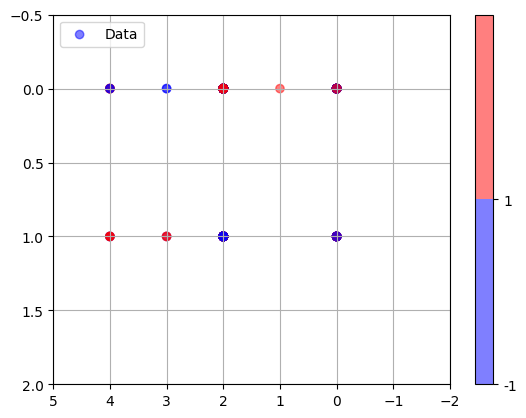

In [ ]:
plotSvm(X_train_svm.to_numpy(), y_train_svm.to_numpy(), bound=[[5., -2.], [2., -.5]])

Number of support vectors = 350


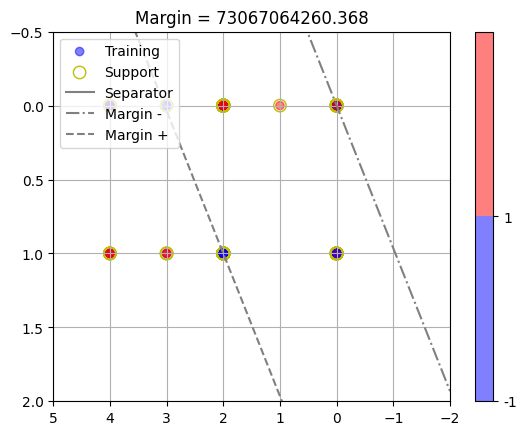

In [125]:
plotSvm(X_train_svm.to_numpy(), y_train_svm.to_numpy(), model.supportVectors, model.w, model.intercept, label = 'Training',bound=[[5., -2.], [2., -.5]])

In [128]:
X_test_svm.drop(columns = ['encounter_id', 'patient_nbr'], inplace = True)
X_test_svm.drop(columns = ['additional_diagnosis'], inplace = True)

In [130]:
y_predict_svm = model.predict(X_test_svm)

Number of support vectors = 350


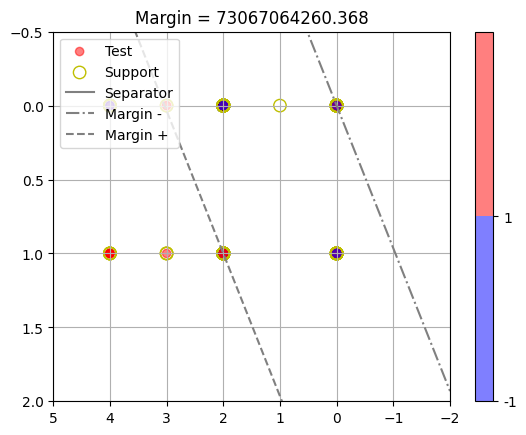

In [131]:
plotSvm(X_test_svm.to_numpy(), y_predict_svm.to_numpy(), model.supportVectors, model.w, model.intercept, label = 'Test',bound=[[5., -2.], [2., -.5]])